# Firing rate maps (per-trajectory, not pooled)

Computes occupancy and firing-rate maps for one neuron at a time, separately for each of the 50 trajectories.

Design notes (fixes vs. the original pipeline):
- Occupancy map and firing-rate map are built with the *same* `np.histogram2d` call signature (same `bins`, same fixed `range`), so they always land on an identical grid — no separate meshgrid/nearest-bin search, no row/column mismatch possible.
- Bin edges are pinned explicitly to the known trajectory bounds `[0, 1] x [0, 1]` via `range=`, instead of being derived from each call's own data min/max — every trajectory's map is on the exact same physical grid, so maps are directly comparable across trials.
- No `rotate()` calls anywhere. The only reorientation is a single `.T` + `origin='lower'` applied consistently at plot time (see `plot_random_trajectory_maps`), so there's nothing that can drift out of sync between maps.
- Activation values are converted to amplitude (`np.abs`) before binning, so complex-valued activity from the oscillatory network is handled explicitly rather than silently truncated by an implicit complex-to-real cast.
- Firing rate = occupancy-weighted mean amplitude per bin (a spatial average), not a threshold-then-peak value — avoids an arbitrary spike threshold and matches how rate maps are usually computed for continuous-valued unit activity.

In [18]:
import numpy as np
import matplotlib.pyplot as plt
import pickle
from scipy.ndimage import gaussian_filter
import scipy.signal


In [89]:
# Trajectory grid bounds and map resolution.
# 1000 points per trajectory / 32x32 bins ~= 1 raw sample per bin before smoothing —
# fine enough to resolve field structure without every bin being empty.
BOUNDS = (0.0, 1.0)
N_BINS = 40
SIGMA = 1.0     # Gaussian smoothing bandwidth, in bins
EPS = 1e-12

SKIP_TIMESTEPS = 50


SI_THRESHOLD = 0.5
SPARSITY_THRESHOLD = 0.3


### Input

In [90]:
def get_input_data(pkl_path, layer_name):
    """
    Loads trajectory-results.pkl.

    Returns
    -------
    ground_truth : (n_traj, T, 2)

    prediction : (n_traj, T, 2)

    positions : (n_traj, T, 2)

    activations : (n_traj, T, n_neurons)
    """

    with open(pkl_path, "rb") as f:
        data = pickle.load(f)

    ground_truth = np.asarray(data["ground_truth"])
    prediction   = np.asarray(data["prediction"])
    activations  = np.asarray(data[layer_name])

    # Keep only x,y if additional channels exist
    if ground_truth.shape[-1] > 2:
        ground_truth = ground_truth[..., :2]

    if prediction.shape[-1] > 2:
        prediction = prediction[..., :2]

    # ---------------------------------------------------------
    # Remove initial stabilization period
    # ---------------------------------------------------------

    if SKIP_TIMESTEPS > 0:

        ground_truth = ground_truth[:, SKIP_TIMESTEPS:, :]

        prediction = prediction[:, SKIP_TIMESTEPS:, :]

        activations = activations[:, SKIP_TIMESTEPS:, :]

    # Use prediction for occupancy / firing-rate maps
    positions = prediction.copy()

    return ground_truth, prediction, positions, activations

In [91]:
def get_input_data(pkl_path, layer_name):
    """
    Loads trajectory-results.pkl.

    Returns
    -------
    ground_truth : (n_traj, T, 2)

    prediction : (n_traj, T, 2)

    positions : (n_traj, T, 2)

    activations : (n_traj, T, n_neurons)
    """

    with open(pkl_path, "rb") as f:
        data = pickle.load(f)

    ground_truth = np.asarray(data["ground_truth"])
    prediction   = np.asarray(data["prediction"])
    activations  = np.asarray(data[layer_name])

    # Keep only x,y if additional channels exist
    if ground_truth.shape[-1] > 2:
        ground_truth = ground_truth[..., :2]

    if prediction.shape[-1] > 2:
        prediction = prediction[..., :2]

    # ---------------------------------------------------------
    # Remove initial stabilization period
    # ---------------------------------------------------------

    if SKIP_TIMESTEPS > 0:

        ground_truth = ground_truth[:, SKIP_TIMESTEPS:, :]

        prediction = prediction[:, SKIP_TIMESTEPS:, :]

        activations = activations[:, SKIP_TIMESTEPS:, :]

    # Use prediction for occupancy / firing-rate maps
    positions = prediction.copy()

    return ground_truth, prediction, positions, activations

### Mapping functions

In [92]:
def occupancy_map_func(positions, bins=N_BINS, bounds=BOUNDS, sigma=SIGMA):
    '''
    positions: (T, 2) single trajectory.
    Returns a smoothed occupancy-count map, shape (bins, bins), axis 0 = x-bin, axis 1 = y-bin.
    '''
    H, xedges, yedges = np.histogram2d(
        positions[:, 0], positions[:, 1],
        bins=bins, range=[bounds, bounds]
    )
    occupancy = gaussian_filter(H, sigma=sigma, mode='constant', cval=0.0)
    return occupancy, xedges, yedges

In [93]:
def firing_rate_map_func(positions, activity, occupancy_map, bins=N_BINS, bounds=BOUNDS,
                          sigma=SIGMA, eps=EPS, min_occupancy=None):
    amplitude = np.abs(activity)

    activity_sum, _, _ = np.histogram2d(
        positions[:, 0], positions[:, 1],
        bins=bins, range=[bounds, bounds],
        weights=amplitude
    )
    activity_sum = gaussian_filter(activity_sum, sigma=sigma, mode='constant', cval=0.0)
    occupancy_map = gaussian_filter(occupancy_map, sigma=0, mode='nearest', cval=0.0)  # already smoothed upstream — don't double-smooth

    rate_map = activity_sum / (occupancy_map + eps)

    if min_occupancy is not None:
        rate_map = np.where(occupancy_map < min_occupancy, np.nan, rate_map)

    return rate_map

### Plotting

In [94]:
def spatial_information(rate_map, occupancy_map):
    valid = (~np.isnan(rate_map)) & (occupancy_map > 0)
    p = occupancy_map[valid] / occupancy_map[valid].sum()
    r = rate_map[valid]
    r_bar = np.sum(p * r)
    if r_bar <= 0:
        return 0.0
    ratio = r / r_bar

    info_terms = np.zeros_like(r)

    positive = ratio > 0

    info_terms[positive] = (p[positive] * ratio[positive] * np.log2(ratio[positive]))

    return np.sum(info_terms)


def sparsity(rate_map, occupancy_map):
    valid = (~np.isnan(rate_map)) & (occupancy_map > 0)
    p = occupancy_map[valid] / occupancy_map[valid].sum()
    r = rate_map[valid]
    mean_r = np.sum(p * r)
    mean_r2 = np.sum(p * r ** 2)
    if mean_r2 <= EPS:
        return np.nan
    return (mean_r ** 2) / mean_r2

In [95]:
# ==========================================================
# VISUALIZE ONE NEURON
# ==========================================================

def visualize_neuron(neuron_idx):

    activity = np.abs(activations_all[:, neuron_idx])

    rate_map = firing_rate_map_func(
        positions_all,
        activity,
        occupancy_map,
        bins=N_BINS,
        bounds=BOUNDS,
        sigma=SIGMA,
        eps=EPS,
    )

    # --------------------------------------------
    # Metrics
    # --------------------------------------------

    si = spatial_information(rate_map, occupancy_map)
    sp = sparsity(rate_map, occupancy_map)

    # --------------------------------------------
    # Normalize activity for colouring/sizing
    # --------------------------------------------

    activity_norm = activity / (activity.max() + 1e-12)

    sizes = 1 + 12 * activity_norm

    # --------------------------------------------
    # Figure
    # --------------------------------------------

    fig, ax = plt.subplots(1, 4, figsize=(22, 5))

    # ======================================================
    # 1. Combined trajectory
    # ======================================================

    ax[0].plot(
        positions_all[:, 0],
        positions_all[:, 1],
        color="black",
        lw=0.15,
    )

    ax[0].set_title("Combined Trajectory")

    ax[0].set_xlim(0, 1)
    ax[0].set_ylim(0, 1)
    ax[0].set_aspect("equal")

    # ======================================================
    # 2. Occupancy map
    # ======================================================

    im_occ = ax[1].imshow(
        occupancy_map.T,
        origin="lower",
        extent=[0, 1, 0, 1],
        cmap="viridis",
    )

    ax[1].set_title("Occupancy Map")
    ax[1].set_aspect("equal")

    plt.colorbar(im_occ, ax=ax[1], fraction=0.046)

    # ======================================================
    # 3. Activity on trajectory
    # ======================================================

    sc = ax[2].scatter(
        positions_all[:, 0],
        positions_all[:, 1],
        c=activity_norm,
        s=sizes,
        cmap="jet",
        alpha=0.75,
        linewidths=0,
    )

    ax[2].set_title(
        f"Neuron {neuron_idx}\n"
        f"SI = {si:.3f}    Sparsity = {sp:.3f}"
    )

    ax[2].set_xlim(0, 1)
    ax[2].set_ylim(0, 1)
    ax[2].set_aspect("equal")

    plt.colorbar(
        sc,
        ax=ax[2],
        fraction=0.046,
        label="Normalized Activity"
    )

    # ======================================================
    # 4. Firing-rate map
    # ======================================================

    im_rate = ax[3].imshow(
        rate_map.T,
        origin="lower",
        extent=[0, 1, 0, 1],
        cmap="jet",
    )

    ax[3].set_title("Firing Rate Map")
    ax[3].set_aspect("equal")

    plt.colorbar(
        im_rate,
        ax=ax[3],
        fraction=0.046,
        label="Rate"
    )

    plt.tight_layout()
    plt.show()

    return si, sp

### Example usage

In [108]:


pkl_path = "/Users/ais/Desktop/2026_Summer/2d_hippocampal_cells/2D-traj-results-training.pkl"

layer_name = "d4"
NEURON = 37

ground_truth, prediction, positions, activations = get_input_data(
    pkl_path,
    layer_name=layer_name
)

print("Ground truth :", ground_truth.shape)
print("Prediction   :", prediction.shape)
print("Positions    :", positions.shape)
print("Activations  :", activations.shape)


Ground truth : (500, 450, 2)
Prediction   : (500, 450, 2)
Positions    : (500, 450, 2)
Activations  : (500, 450, 100)


In [109]:
# ==========================================================
# Combine all trajectories into one long trajectory
# ==========================================================

ground_truth, prediction, positions, activations = get_input_data(
    pkl_path,
    layer_name
)

# positions:   (500, 450, 2)
# activations: (500, 450, 100)

positions_all = positions.reshape(-1, 2)
activations_all = activations.reshape(-1, activations.shape[-1])

print("Positions :", positions_all.shape)
print("Activations:", activations_all.shape)

Positions : (225000, 2)
Activations: (225000, 100)


In [110]:
# ==========================================================
# Compute SI and Sparsity for all neurons
# ==========================================================

results = []

n_neurons = activations_all.shape[1]

for neuron in range(n_neurons):

    activity = np.abs(activations_all[:, neuron])

    rate_map = firing_rate_map_func(
        positions_all,
        activity,
        occupancy_map,
        bins=N_BINS,
        bounds=BOUNDS,
        sigma=SIGMA,
        eps=EPS,
    )

    si = spatial_information(rate_map, occupancy_map)
    sp = sparsity(rate_map, occupancy_map)

    results.append({
        "Neuron": neuron,
        "SI": si,
        "Sparsity": sp
    })

In [111]:
import pandas as pd

results_df = pd.DataFrame(results)

In [112]:
results_df = results_df.sort_values(
    by="SI",
    ascending=False
).reset_index(drop=True)

results_df

,Neuron,SI,Sparsity
0,79,1.137286,0.293635
1,36,1.008768,0.303299
2,74,0.635192,0.520610
3,61,0.609656,0.523229
4,87,0.607955,0.541172
...,...,...,...
95,29,0.099195,0.879895
96,31,0.084239,0.893156
97,23,0.069355,0.910350
98,25,0.026090,0.964763


In [113]:
display(results_df.head(20))

,Neuron,SI,Sparsity
0,79,1.137286,0.293635
1,36,1.008768,0.303299
2,74,0.635192,0.520610
3,61,0.609656,0.523229
4,87,0.607955,0.541172
5,50,0.578473,0.520179
6,49,0.534158,0.572374
7,96,0.523525,0.555304
8,64,0.521978,0.561809
9,78,0.498069,0.523682


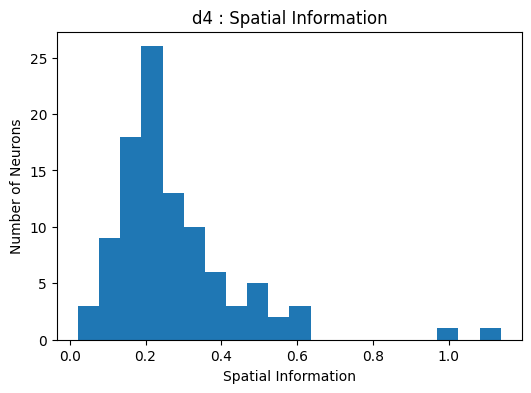

In [114]:
plt.figure(figsize=(6,4))

plt.hist(results_df["SI"], bins=20)

plt.xlabel("Spatial Information")
plt.ylabel("Number of Neurons")

plt.title(f"{layer_name} : Spatial Information")

plt.show()

Neuron 79


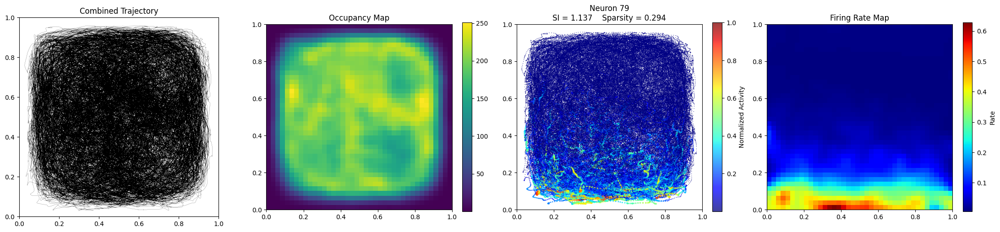

Neuron 36


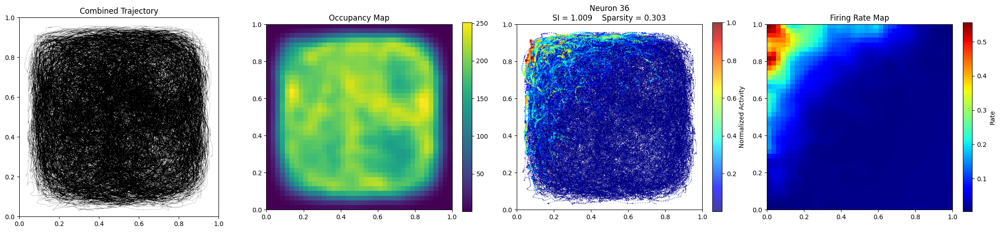

Neuron 74


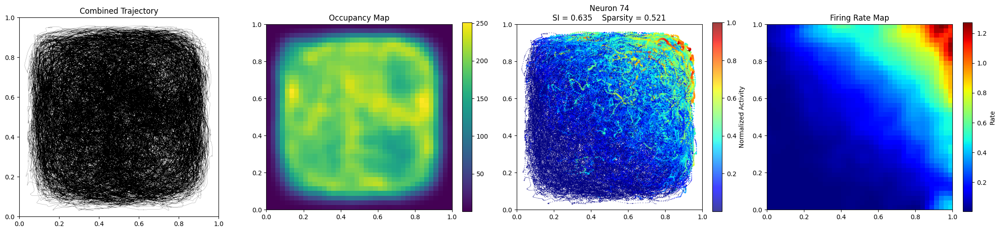

Neuron 61


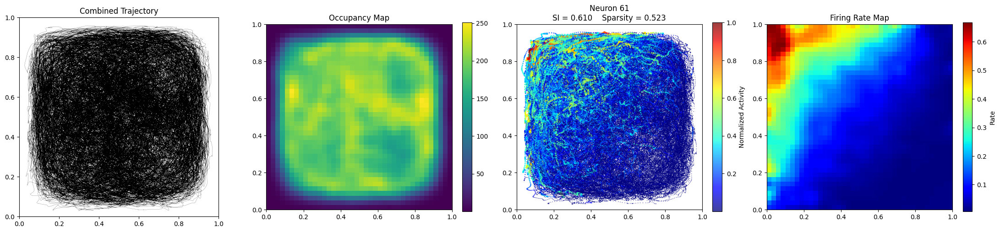

Neuron 87


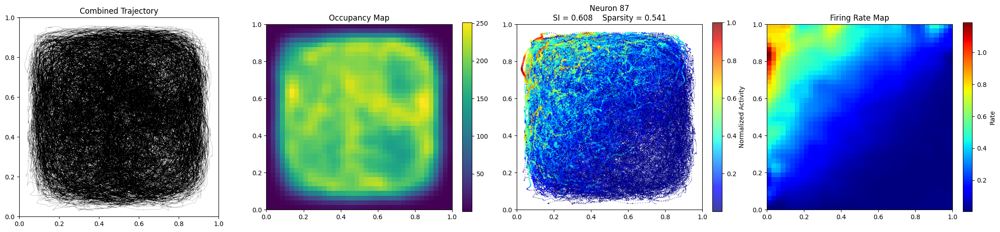

Neuron 50


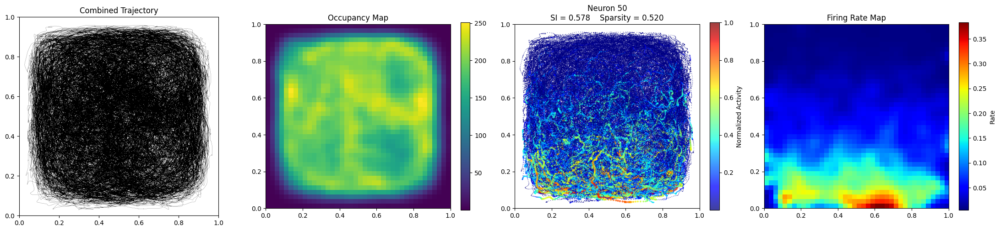

Neuron 49


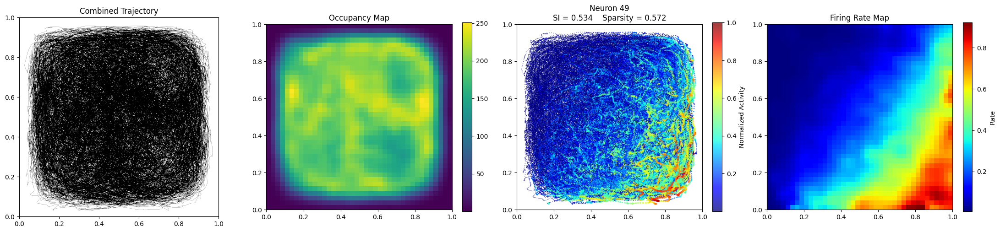

Neuron 96


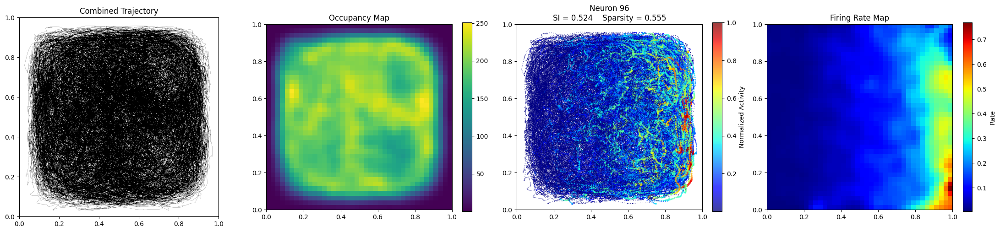

Neuron 64


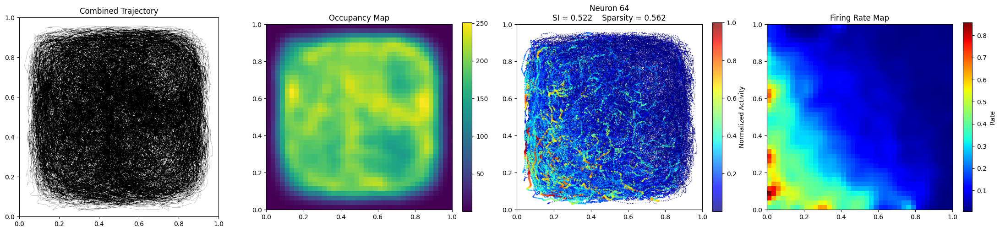

Neuron 78


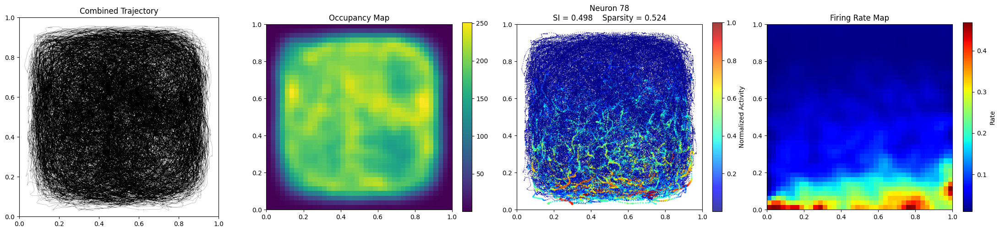

Neuron 62


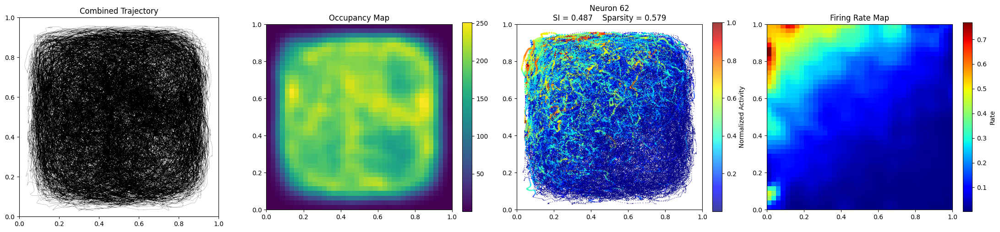

Neuron 1


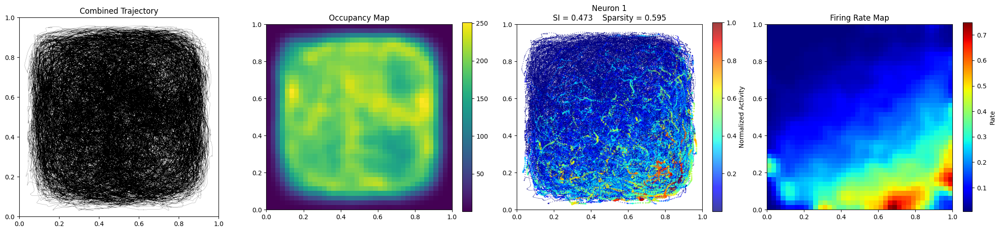

Neuron 21


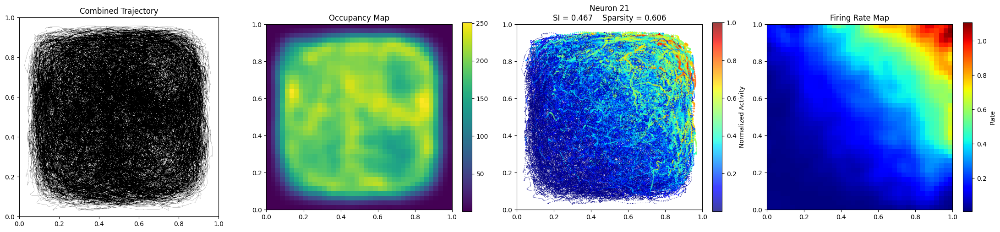

Neuron 77


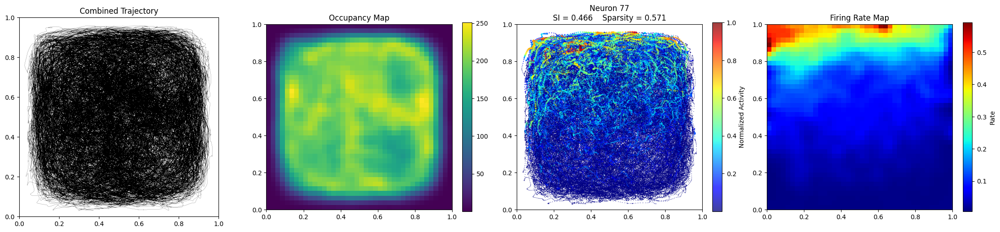

Neuron 53


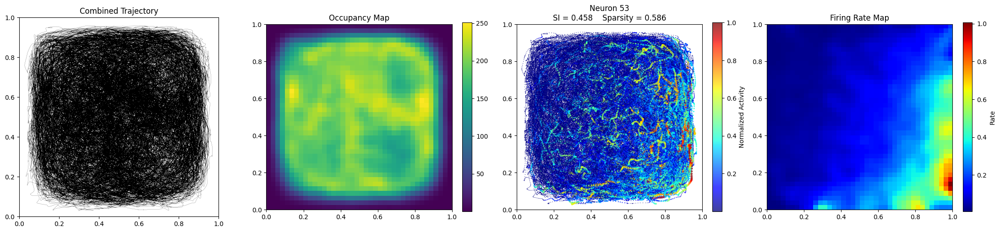

Neuron 24


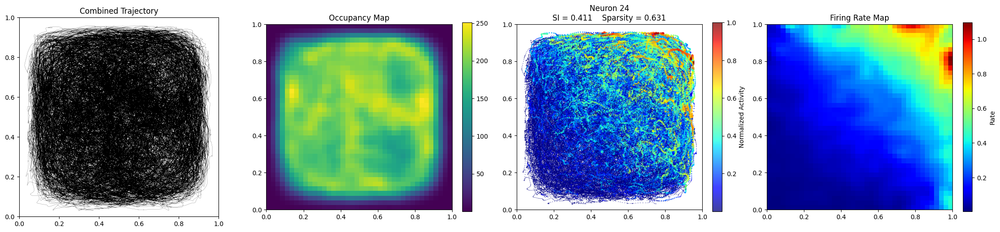

Neuron 10


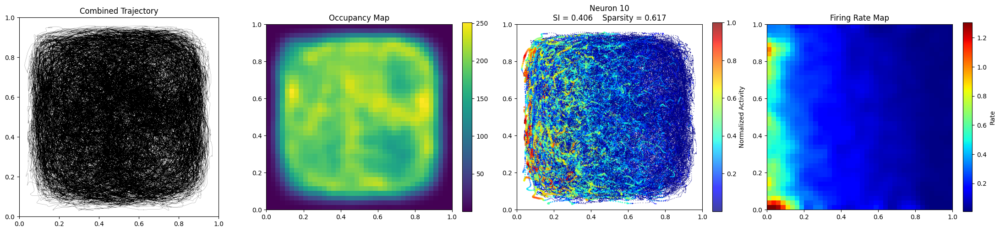

Neuron 37


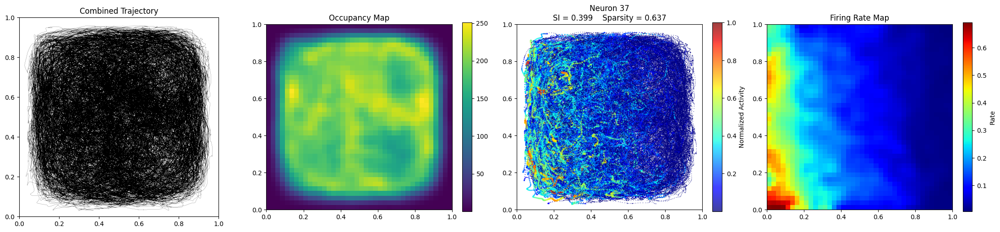

Neuron 19


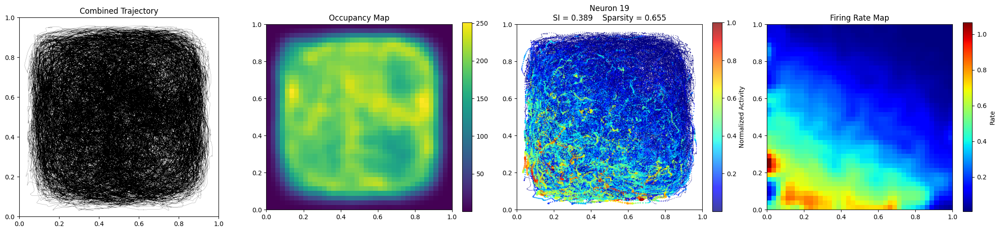

Neuron 8


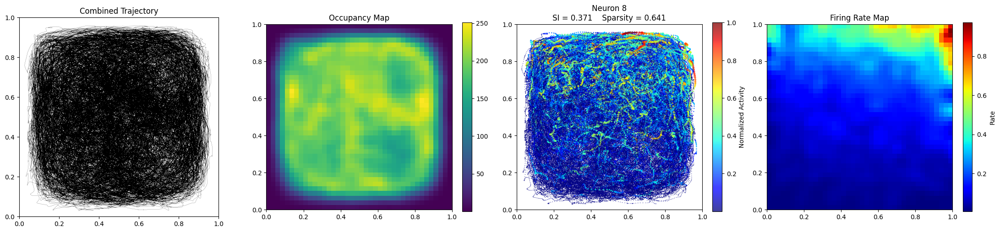

In [115]:
TOP = 20

for neuron in results_df["Neuron"].head(TOP):

    print("=" * 70)
    print(f"Neuron {neuron}")
    print("=" * 70)

    visualize_neuron(neuron)